In [1]:
import numpy as np
import torch
from bayesian_seg import *

# from Fpn import FPN
import cv2
import matplotlib.pyplot as plt
import math
import os
from deeplab import deeplabv3
from pspnet import PSPNet
import json
import torch.nn as nn
from skimage.segmentation import slic
import segmentation_models_pytorch as sm
from misc import *
from bayesian_seg import Bayesian_UNet
from unet import UNet

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# model = FPN(in_channels=1, classes=9)
# model = sm.PSPNet(encoder_name='resnet34', encoder_weights = None, encoder_depth = 3, psp_out_channels = 512, classes=9, activation="sigmoid")
# model = UNet(3, 5)
model = Bayesian_UNet(3, 5)
# model = deeplabv3(pretrained=False, progress=True, num_classes=9)
model.to(device=device)
model.load_state_dict(torch.load("./checkpoints/Final_model.pth", map_location=device))

<All keys matched successfully>

In [3]:
model

Bayesian_UNet(
  (inc): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): CustomDropout(p=0.3, activate=True)
    )
  )
  (down1): Down(
    (maxpool_conv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (double_conv): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(

In [4]:
switch_custom_dropout(model, activate=False)

Current active : True
Switching to : False
Current active : True
Switching to : False
Current active : True
Switching to : False
Current active : True
Switching to : False
Current active : True
Switching to : False
Current active : True
Switching to : False
Current active : True
Switching to : False


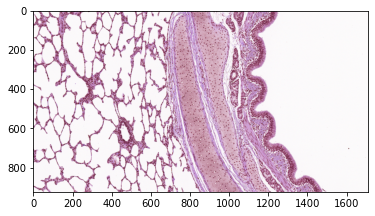

In [8]:
im = cv2.imread("./test_images/17.1972.swine.healthy.1.10X.PNG")
plt.imshow(increase_brightness(im, value=10))

im_h, im_w = im.shape[:-1]
window_size = 512
step_size = 256
batch = []
for i in range(0, im_h-window_size, step_size):
    for j in range(0, im_w-window_size, step_size):
        batch.append(im[i:i+window_size, j:j+window_size])
    batch.append(im[i:i+window_size, im_w-window_size:im_w])
for j in range(0, im_w-window_size, step_size):
    batch.append(im[im_h-window_size:im_h, j:j+window_size])
batch.append(im[im_h-window_size:im_h, im_w-window_size:im_w])
batch = np.moveaxis(np.array(batch), -1, 1)
# batch = nn.functional.interpolate(torch.Tensor(batch), size=(256, 256), 
#                                      scale_factor=None, mode='bilinear', align_corners=True, recompute_scale_factor=None).to(device=device)

In [9]:
batch = nn.functional.interpolate(torch.from_numpy(batch)/255, size=(256, 256), 
                                     scale_factor=None, mode='bilinear', align_corners=True, recompute_scale_factor=None).to(device=device)
batch.shape

torch.Size([18, 3, 256, 256])

In [10]:
outs = model(batch)
outs = outs.detach()

In [11]:
outs.shape

torch.Size([18, 5, 256, 256])

In [12]:
outs = nn.functional.interpolate(outs, size=(512, 512), 
                                     scale_factor=None, mode='bilinear', align_corners=True, recompute_scale_factor=None).to(device="cpu").numpy()

In [13]:
outs.shape

(18, 5, 512, 512)

In [14]:
# out = np.squeeze(outs*255).astype(np.uint8)
out = np.zeros((5, im_h, im_w))
n = 0
for i in range(0, im_h-window_size, 256):
    for j in range(0, im_w-window_size, 256):
        out[:, i:i+window_size, j:j+window_size] = outs[n]
        n += 1
    out[:, i:i+window_size, im_w-window_size:im_w] = outs[n]
    n +=1
for j in range(0, im_w-window_size, 256):
    out[:, im_h-window_size:im_h, j:j+window_size] = outs[n]
    n += 1
out[:, im_h-window_size:im_h, im_w-window_size:im_w] = outs[n]

In [15]:
# # labels = {0: 'Respiratory epithelium',  1: 'Smooth muscle',  2: 'Macrophage',  3: 'Edema',  4: 'Alveolar septae',  5: 'Red blood cell(s)',  6: 'Lamina propria',  7: 'Cartilage'}
# fig, axs = plt.subplots(4, 3, figsize=(120, 120))
# axs[0, 0].imshow(im)
# axs[0, 0].set_title(i, fontsize=50)
# for n,i in enumerate(range(out.shape[0])):
#     axs[int(i/3)+1, int(i%3)].imshow(out[i]>0.5)
# #     axs[int(i/3)+1, int(i%3)].set_title(labels[n], fontsize=50)

In [16]:
segments = slic(im, n_segments=1000, compactness=28)
segments = segments

In [17]:
out_2 = np.zeros_like(out)
for j in range(out_2.shape[0]):
    for i in np.unique(segments):
        out_2[j][np.where(segments==i)] = np.mean(out[j][np.where(segments==i)], axis=0)

In [18]:
classes = os.listdir("./histology_dataset/20/train/GT/")
classes.sort()
labels = {n:i for n,i in enumerate(classes)}

In [19]:
def highlight_im(im, mask, threshold=0.5):
    threshold = int(threshold*255)
    mask = (mask*255).astype(np.uint8)
    ret, binary = cv2.threshold(mask, threshold, 255, cv2.THRESH_BINARY)
    
    contours,hierarchy = cv2.findContours(binary, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

    for contour in contours:
        cv2.drawContours(im, contour, -1, (255,0,0), thickness = 1)

    b,g,r = cv2.split(im)

    b = cv2.add(b, 100, dst = b, mask = binary, dtype = cv2.CV_8U)
    g = cv2.add(g, 100, dst = g, mask = binary, dtype = cv2.CV_8U)
#     r = cv2.add(r, 100, dst = r, mask = binary, dtype = cv2.CV_8U)

    return cv2.merge((b,g,r), im)

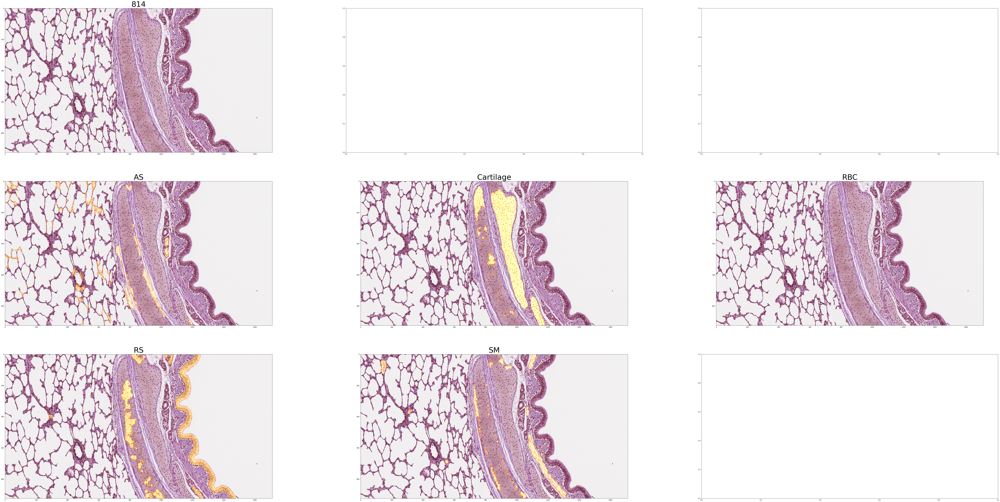

In [20]:
fig, axs = plt.subplots(3, 3, figsize=(120, 60))
axs[0, 0].imshow(im)
axs[0, 0].set_title(i, fontsize=50)
for n,i in enumerate(range(out_2.shape[0])):
    axs[int(i/3)+1, int(i%3)].imshow(highlight_im(im.copy(), out[i].copy()))
    axs[int(i/3)+1, int(i%3)].set_title(labels[n], fontsize=50)